<a href="https://colab.research.google.com/github/xaris4/l3596-c1-u2_praktiki_efarmogi/blob/main/Threat_Hunting_C.Makris.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#εγκατάσταση πακέτου pycaret (https://pycaret.org/)
!pip install pycaret
#εγκατάσταση πακέτου dataprep (https://dataprep.ai/)
!pip install dataprep
#***ΠΡΟΣΟΧΗ*** μετά την εγκατάσταση χρειάζεται restart το session
#***θα σας ζητηθεί επανεκκίνηση με σχετικό κόκκινο μήνυμα μετά την ολοκλήρωση της εγκατάστασης
#***Πατήστε το κουμπί RESTART SESSION στο σχετικό μήνυμα

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.0/165.0 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.6

In [2]:
#εισαγωγή βιβλιοθηκών - πακέτων
import pandas as pd
import matplotlib.pyplot as plt
from pycaret.regression import *
from dataprep.eda import create_report
from pyod.models.iforest import IForest

In [30]:
#εισαγωγή του συνόλου δεδομένων
darknet_df_url = "https://raw.githubusercontent.com/kdemertzis/EKPA/main/Data/DarkNet.csv"
darknet_df = pd.read_csv(darknet_df_url) # Read the data from the URL

In [32]:
# Filter rows where the "Label-1" column contains "VPN"
vpn_traffic_df = darknet_df[darknet_df["Label-1"] == "VPN"]




In [38]:
#ανακάτεμα των δεδομένων
darknet_df = darknet_df.sample(frac = 1)

In [39]:
# Display the first few rows of the VPN traffic dataset
vpn_traffic_df.head()

,Src_IP,Src_Port,Dst_IP,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,...,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label-1,Label-2
13678,10.8.8.178,15685,157.55.235.153,40002,17,145230,1,1,34,482,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13679,205.188.12.91,443,10.8.8.178,48911,6,47759206,44,44,6208,2404,...,0,0,0,0,1433360000000000,15174940.63,1433360000000000,1433360000000000,VPN,Chat
13680,10.8.8.178,23581,78.46.223.24,53,17,146178,1,1,36,409,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13681,10.8.8.178,33829,198.7.63.141,53,17,146060,1,1,36,126,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13682,157.56.52.13,40011,10.8.8.178,56909,6,271053,2,0,2,0,...,0,0,0,0,0,0.00,0,0,VPN,Chat


ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Total_Length_...ket'


DataPrep Report
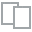
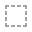
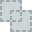
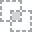
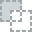
...
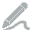
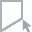
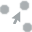
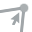
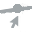

In [41]:
#Διερευνητική ανάλυση δεδομένων (Exploratory Data Analysis - EDA)
create_report(darknet_df)

In [42]:

#διαχωρισμός των δεδομένων σε σύνολα εκπαίδευσης (train) και δοκιμών (test)
train_size = int(0.8 * len(darknet_df))
train_df = darknet_df[:train_size]
test_df = darknet_df[train_size:]

In [43]:
#Εκκίνηση της ρύθμισης του PyCaret με προεπεξεργασία δεδομένων
reg_setup = setup(data=df, target='flowDuration', session_id=42,
                  normalize=True, transformation=True,
                  ignore_features=['proto'])

ValueError: Invalid value for the target parameter. Column flowDuration not found in the data.

In [ ]:
#σύγκριση των διαθέσιμων μοντέλων ΜΜ
best = compare_models(cross_validation=False, n_select = 1)
%load_ext tensorboard

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,5.5044,505.5523,22.4845,0.9875,0.2326,276.1599,5.1800
xgboost,Extreme Gradient Boosting,5.5470,629.6720,25.0933,0.9844,0.2361,309.0134,4.2100
et,Extra Trees Regressor,3.4673,672.7673,25.9378,0.9833,0.0631,0.0265,48.5800
br,Bayesian Ridge,13.1193,789.9235,28.1056,0.9804,1.1004,2523.2806,4.3000
lr,Linear Regression,13.1192,789.9231,28.1056,0.9804,1.1004,2522.8783,3.1700
par,Passive Aggressive Regressor,16.9708,925.3548,30.4196,0.9771,1.6128,9083.5786,13.6700
rf,Random Forest Regressor,4.0716,1035.5357,32.1797,0.9744,0.0749,0.0326,154.4700
gbr,Gradient Boosting Regressor,12.8008,1752.4586,41.8624,0.9566,0.6485,2551.4373,48.7000
dt,Decision Tree Regressor,5.7040,1944.6371,44.0980,0.9518,0.1014,0.0425,5.9700
ridge,Ridge Regression,34.9577,4207.9586,64.8688,0.8958,2.1980,41088.9605,3.0300


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
#αναφορά των υπερπαραμέτρων του μοντέλου με την υψηλότερη απόδοση
print(best)

LGBMRegressor(n_jobs=-1, random_state=42)


In [ ]:
#μέτρα αξιολόγησης του μοντέλου με την υψηλότερη απόδοση
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
#δημιουργία μοντέλου ανίχνευσης ανωμαλιών Isolation Forest
iforest = IForest(contamination=0.1)
iforest.fit(train_df[['flowDuration']])


IForest(behaviour='old', bootstrap=False, contamination=0.1, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
    verbose=0)

In [ ]:
#πίνακας προβλέψεων με ανωμαλίες στο σύνολο δοκιμών
test_df['anomaly'] = iforest.predict(test_df[['flowDuration']])

In [ ]:
#δημιουργία νέας στήλης 'Label' με βάση το αποτέλεσμα του ελέγχου ανίχνευσης ανωμαλιών
test_df['Label'] = test_df['anomaly'].apply(lambda x: 'Anomaly' if x == 1 else 'Normal')

In [ ]:
#εκτύπωση των ανωμαλιών
print("Ανωμαλίες στο Test Set:")
print(test_df[test_df['anomaly'] == 1][['flowDuration', 'Label']])

Ανωμαλίες στο Test Set:
        flowDuration    Label
89223     203.069649  Anomaly
76251     439.015167  Anomaly
67977     253.071063  Anomaly
88046     197.176898  Anomaly
130168    245.489772  Anomaly
...              ...      ...
51589    1435.551520  Anomaly
94376     441.674211  Anomaly
22473     891.549533  Anomaly
12017     102.965486  Anomaly
114249    373.356144  Anomaly

[3117 rows x 2 columns]


In [ ]:
#κατανομή των προβλέψεων για το σύνολο δοκιμών
total_test_samples = len(test_df)
normal_test_samples = len(test_df[test_df['Label'] == 'Normal'])
anomaly_test_samples = len(test_df[test_df['Label'] == 'Anomaly'])

print(f"\nΣύνολο Δοκιμών (Test Set): {total_test_samples}")
print(f"Φυσιολογικές Προβλέψεις: {normal_test_samples}")
print(f"Ανώμαλες Προβλέψεις: {anomaly_test_samples}")
print(f"Ποσοστό Ανωμαλιών: {(anomaly_test_samples / total_test_samples) * 100:.2f}%")


Σύνολο Δοκιμών (Test Set): 31025
Φυσιολογικές Προβλέψεις: 27908
Ανώμαλες Προβλέψεις: 3117
Ποσοστό Ανωμαλιών: 10.05%
